In [123]:
%load_ext autoreload
%autoreload 2
%matplotlib notebook

import sys
sys.path.append("..")
import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from src.utils import MARCINIAK_DATASET_PATH, NIEMCZYK_DATASET_PATH, side_path, raw_coins_path, cropped_coins_path
import numpy as np
from src.detector import create_circular_mask, BACKGROUND_VALUE
import pandas as pd
from src.alignment import REF_IMG_DICT, align_with_reference
from src.utils import *
from PIL import Image
import os
import pandas as pd
from tqdm.notebook import tqdm
from src.master_coin_utils import get_design_mask, get_wear_marks
from src.image_utils import remove_illumination
# from tqdm import tqdm
import seaborn as sns
from cv2.xfeatures2d import SIFT_create as SIFTDetector
from src.detector import BriefDetector


plt.rcParams['font.size'] = 12

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


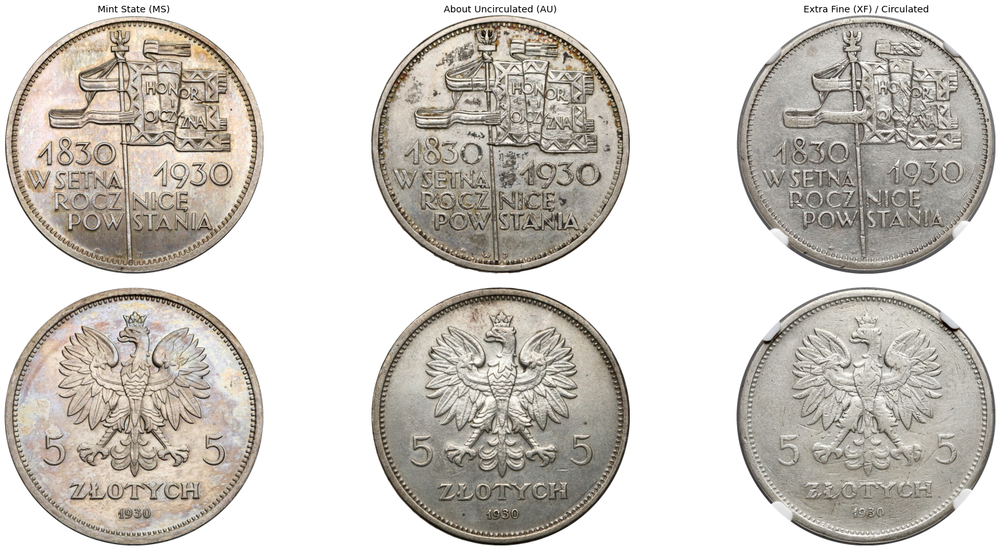

In [2]:
ds_path = MARCINIAK_DATASET_PATH
root = cropped_coins_path(ds_path)

plt.figure(figsize = (30,15))
gs = gridspec.GridSpec(2, 3)
gs.update(wspace=0.025, hspace=0.05)
axs = []

for i, name in enumerate(['35_1.jpg', '1_1.jpg',  '21_3.jpg', '35_4.jpg', '1_2.jpg', '21_2.jpg']):
    ax = plt.subplot(gs[i])
    plt.axis('off')
    ax.set_aspect('equal')
    im = cv2.imread(root + "/" + name)
    ax.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
    axs.append(ax)
    
axs[0].set_title("Mint State (MS)")
axs[1].set_title("About Uncirculated (AU)")
axs[2].set_title("Extra Fine (XF) / Circulated")
plt.show()

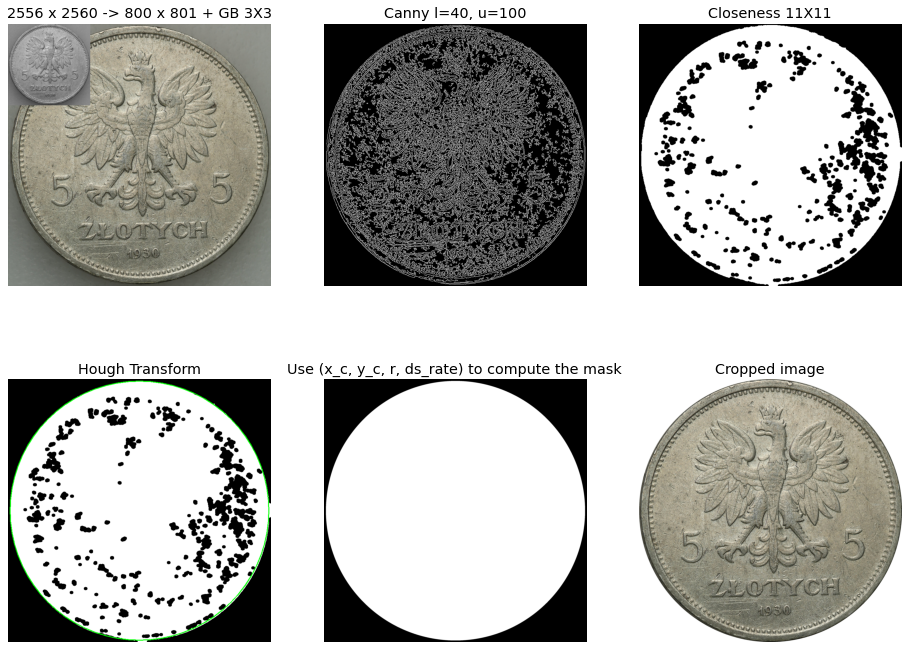

In [97]:
ds_path = NIEMCZYK_DATASET_PATH
root = raw_coins_path(ds_path)

name = '110_2.jpg'
img_orig = cv2.imread(root + "/" + name)

height_img_ds=800
gb_size=(3,3)
canny_th1=40
canny_th2=100
hough_param2=1
mc_size=(11, 11)

fig, ax = plt.subplots(2,3,figsize = (16,12))
ax = ax.flatten()
for x in ax:
    x.axis('off')

ds_ratio = height_img_ds/img_orig.shape[0]
img_ds = cv2.resize(img_orig, None, fx=ds_ratio, fy=ds_ratio, interpolation=cv2.INTER_AREA)
gray = cv2.cvtColor(img_ds, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, gb_size, 0)

im_to_show = img_orig.copy()
im_to_show[:img_ds.shape[0], :img_ds.shape[1]] = np.tile(gray[:, :, None], [1, 1, 3])
im_to_show = cv2.cvtColor(im_to_show, cv2.COLOR_BGR2RGB)
ax[0].imshow(im_to_show)
ax[0].set_title("%d x %d -> %d x %d + GB 3X3" % (img_orig.shape[0], img_orig.shape[1], img_ds.shape[0],img_ds.shape[1]))

thresh = cv2.Canny(gray, canny_th1, canny_th2)
ax[1].imshow(thresh, cmap='gray')
ax[1].set_title("Canny l={}, u={}".format(canny_th1, canny_th2))

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, mc_size)
closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
ax[2].imshow(closed, cmap='gray')
ax[2].set_title("Closeness {}X{}".format(mc_size[0], mc_size[1]))

    
circles = cv2.HoughCircles(closed, cv2.HOUGH_GRADIENT, 1, minDist=img_ds.shape[0], param1=canny_th2, param2=hough_param2, minRadius=int(0.35 * img_ds.shape[0]), maxRadius=int(0.5 * img_ds.shape[0]))
circles = circles[0,:]
(x, y, r) = max(circles, key=lambda c: c[2])
im_to_show = cv2.circle(np.tile(closed[:, :, None], [1, 1, 3]), (int(x), int(y)), int(r), (0,255,0), 2)
ax[3].imshow(im_to_show, cmap='gray')
ax[3].set_title("Hough Transform")

x, y, r = x/ds_ratio, y/ds_ratio, r/ds_ratio
mask = create_circular_mask(img_orig.shape[0], img_orig.shape[1], center=(x,y), radius=r)
ax[4].imshow(mask, cmap='gray')
ax[4].set_title("Use (x_c, y_c, r, ds_rate) to compute the mask")


masked_img = img_orig.copy()
masked_img[~mask] = BACKGROUND_VALUE
startY = max(round(y-r), 0)
startX = max(round(x-r), 0)
endY = min(masked_img.shape[0]-1, round(y+r))
endX = min(masked_img.shape[1]-1, round(x+r))
size = min(endY - startY, endX - startX)
endY = startY + size
endX = startX + size
masked_img = masked_img[startY:endY, startX:endX]
ax[5].imshow(cv2.cvtColor(masked_img, cv2.COLOR_BGR2RGB))
ax[5].set_title("Cropped image")

plt.show()

<IPython.core.display.Javascript object>


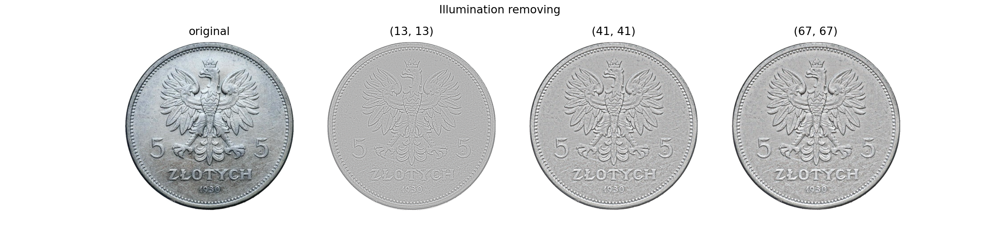

In [139]:
test_im = cv2.imread(aligned_coins_path(MARCINIAK_DATASET_PATH)+ '/100_2.jpg')
test_im = cv2.resize(test_im, (700,700))

fig, ax = plt.subplots(1,4,figsize=(12, 3))
ax = ax.flatten()
for x in ax:
    x.axis('off')

ax[0].imshow(test_im, cmap='gray')
ax[0].set_title("original")
for i, s in enumerate([13, 41, 67]):
    s = int(s)
    if s % 2 == 0:
        s += 1 
    ax[i+1].imshow(remove_illumination(test_im, (s, s), 0), cmap='gray')
    ax[i+1].set_title("(%s, %s)" % (s, s))
fig.suptitle("Illumination removing")
plt.show()

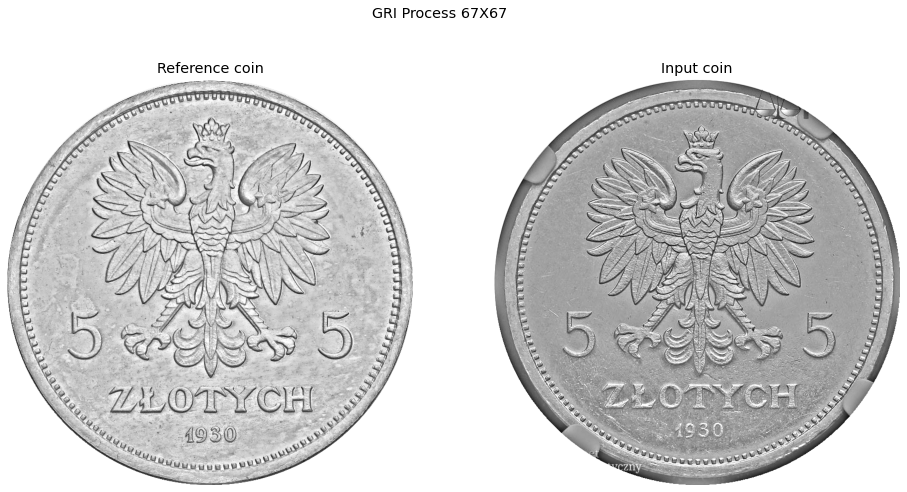

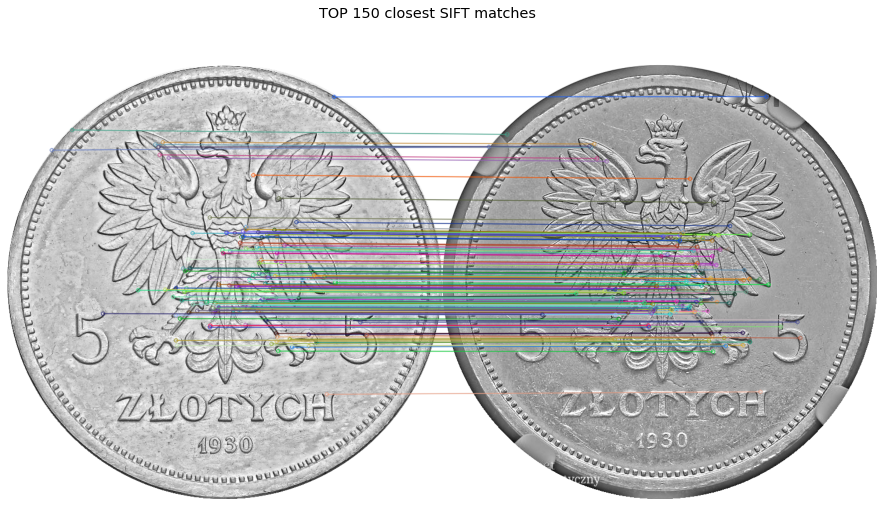

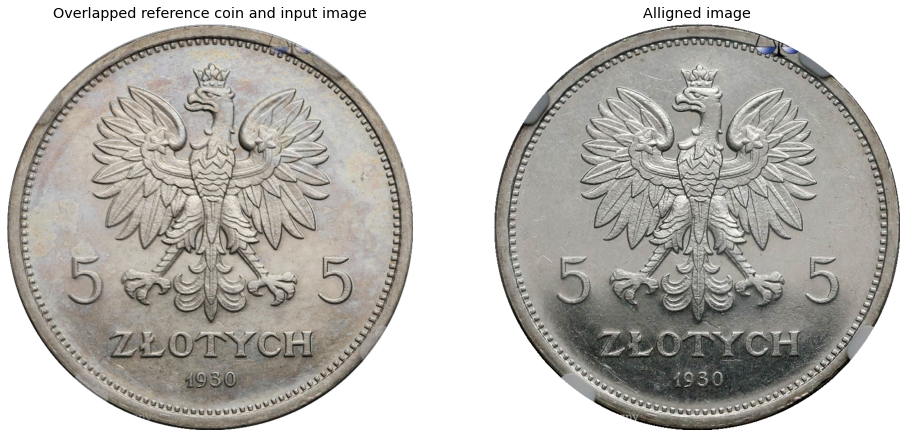

In [105]:
DATASET_PATH = MARCINIAK_DATASET_PATH
name = '124_2.jpg'

side_df = pd.read_csv(side_path(DATASET_PATH), index_col=0)
src_im_orig = REF_IMG_DICT[side_df.loc[name,'label']]
dst_im_orig = cv2.imread(cropped_coins_path(DATASET_PATH) + "/" + name)

align_with_reference(dst_im_orig,
  src_im_orig,
  ds_size = 800,
  matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False),
  use_silx_sift=False,
  # maxIter=2000,
  kernel_size=(67,67),
  name=name,
  verbose=True
);

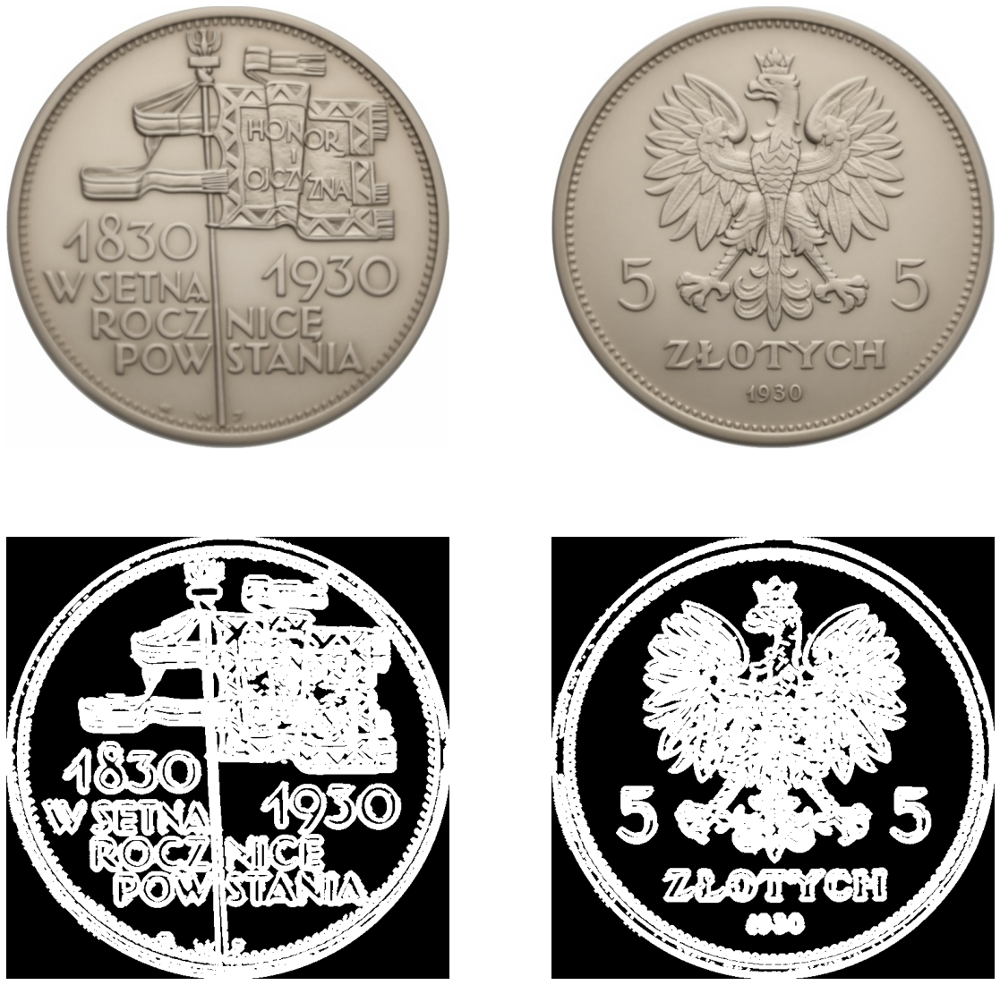

In [108]:
mc_1 = cv2.imread(master_coins_path(MARCINIAK_DATASET_PATH) + "/1_general.jpg")
mc_2 = cv2.imread(master_coins_path(MARCINIAK_DATASET_PATH) + "/2_general.jpg")

fig, ax = plt.subplots(2,2, figsize=(20,20))
ax = ax.flatten()

for x in ax:
    x.axis("off")

ax[0].imshow(cv2.cvtColor(mc_1, cv2.COLOR_BGR2RGB))
ax[1].imshow(cv2.cvtColor(mc_2, cv2.COLOR_BGR2RGB))
ax[2].imshow(get_design_mask(mc_1), cmap='gray')
ax[3].imshow(get_design_mask(mc_2), cmap='gray')

plt.show()

plt.show()

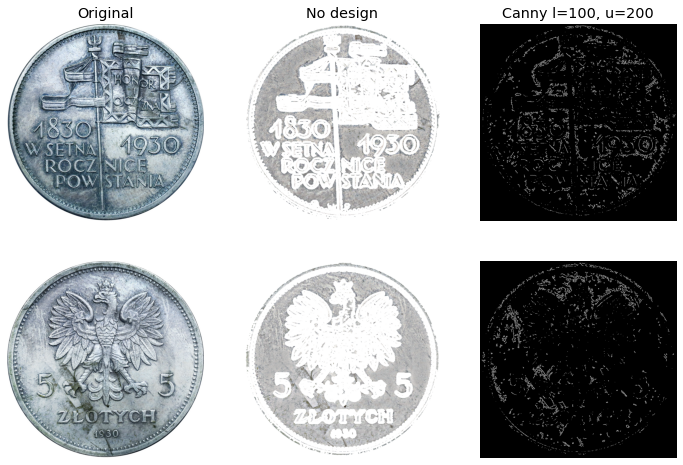

In [130]:
design_mask_1 = get_design_mask(mc_1)
design_mask_2 = get_design_mask(mc_2)

test_coin_1 = cv2.imread(aligned_coins_path(MARCINIAK_DATASET_PATH)+ '/2_3.jpg')
test_coin_2 = cv2.imread(aligned_coins_path(MARCINIAK_DATASET_PATH)+ '/2_2.jpg')

fig, ax = plt.subplots(2,3,figsize=(12,8))
ax = ax.transpose().flatten()
for x in ax:
    x.axis("off")

ax[0].imshow(test_coin_1, cmap='gray')
ax[0].set_title("Original")
ax[1].imshow(test_coin_2, cmap='gray')

ax[2].imshow(get_wear_marks(test_coin_1, design_mask_1, ds_shape=design_mask_1.shape), cmap='gray')
ax[2].set_title("No design")
ax[3].imshow(get_wear_marks(test_coin_2, design_mask_2, ds_shape=design_mask_2.shape), cmap='gray')

ax[4].imshow(get_wear_marks(test_coin_1, design_mask_1, ds_shape=design_mask_1.shape, blur_size=3, canny_l=100, canny_u=200), cmap='gray')
ax[4].set_title("Canny l=100, u=200")
ax[5].imshow(get_wear_marks(test_coin_2, design_mask_2, ds_shape=design_mask_2.shape, blur_size=3, canny_l=100, canny_u=200), cmap='gray')

plt.show()

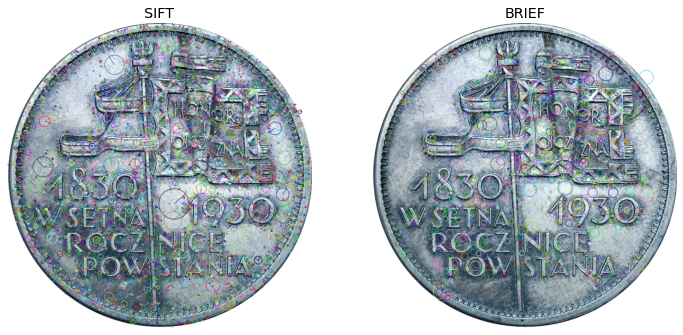

In [144]:
img = cv2.imread(aligned_coins_path(MARCINIAK_DATASET_PATH)+ '/2_3.jpg')
img = cv2.resize(img, (700,700))

sift = SIFTDetector()
brief = BriefDetector()

kp, des = sift.detectAndCompute(img, None)
kp_brief, des_brief = brief.detectAndCompute(img, None)

img_1 = cv2.drawKeypoints(img, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_2 = cv2.drawKeypoints(img, kp_brief, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, ax = plt.subplots(1, 2, figsize=(12,6))
ax[0].imshow(img_1)
ax[0].set_title("SIFT")
ax[0].axis("off")
ax[1].imshow(img_2)
ax[1].set_title("BRIEF")
ax[1].axis("off")
plt.show()

In [146]:
pd.DataFrame(des_brief)

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,25,21,106,199,40,171,169,153,182,26,...,255,34,225,222,101,106,190,87,64,47
1,179,49,255,201,219,192,93,155,226,235,...,197,156,23,206,227,78,244,214,193,254
2,207,171,145,82,227,141,179,230,77,4,...,62,199,234,51,90,149,17,51,63,144
3,27,0,236,204,60,171,49,153,164,157,...,230,26,86,150,233,106,116,77,64,251
4,112,81,70,194,58,246,12,154,150,159,...,203,88,34,201,110,172,146,234,35,241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1368,231,237,177,16,193,205,163,254,110,36,...,54,231,59,102,91,149,27,215,19,42
1369,78,3,245,164,255,150,53,94,235,157,...,37,90,226,210,90,78,162,42,33,210
1370,246,125,155,48,193,12,177,188,105,4,...,54,214,59,98,58,149,219,65,51,8
1371,198,233,179,64,216,205,185,178,206,13,...,55,195,34,66,90,196,145,135,187,0


In [32]:
test_loss_df.values
np.arange(0, 7, 1)
len(test_loss_df)
X = np.arange(0, 4, 1)
Y = np.arange(0, 7, 1)
np.meshgrid(X, Y)
test_loss_df.index

Int64Index([8, 16, 24, 32, 64, 96, 128], dtype='int64')

In [127]:
def drawResults3d(results):
    fig, ax = plt.subplots(subplot_kw={"projection": "3d"}, figsize=(8,8))
#     fig.suptitle("Train/Test F1 score. Experiments 1")

    X = np.arange(0, 4, 1)
    Y = np.arange(0, 7, 1)
    X_mesh, Y_mesh = np.meshgrid(X, Y)

    for result in results:
        surf = ax.plot_surface(
            X_mesh, Y_mesh, result,
            linewidth=0,
            antialiased=False,
            alpha=0.5,
        )

    ax.set_zlim(0, 1)
    ax.set_xticks(X)
    ax.set_xticklabels(['SVM', 'KNN', 'RF', 'LR'])

    ax.set_yticks(Y)
    ax.set_yticklabels([8, 16, 24, 32, 64, 96, 128])

#     fig.suptitle("")

    plt.show()


<IPython.core.display.Javascript object>


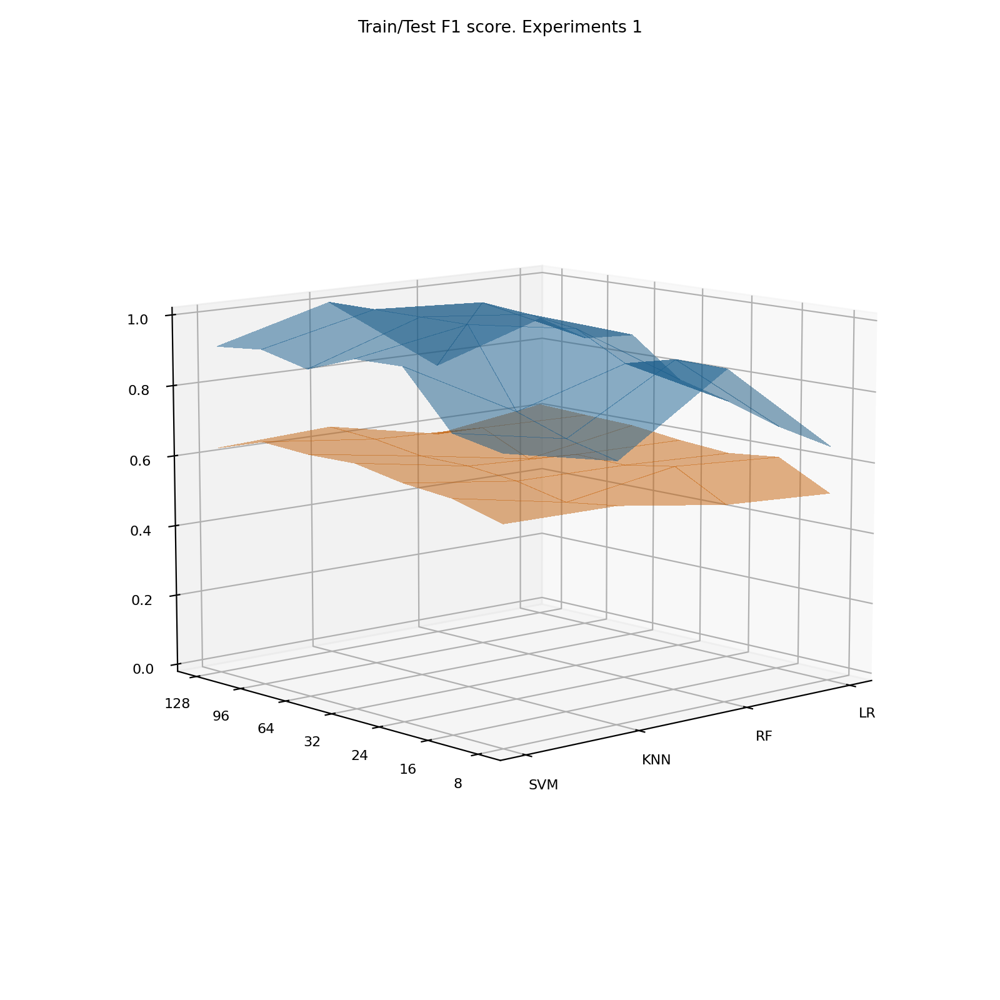

In [129]:
loss_df = pd.read_csv('../results/1_4.csv', index_col=0)
train_loss_df = loss_df.apply(lambda column: column.apply(lambda losses: float(losses.split("/")[0])))
test_loss_df = loss_df.apply(lambda column: column.apply(lambda losses: float(losses.split("/")[1])))

drawResults3d([train_loss_df.values, test_loss_df.values])

<IPython.core.display.Javascript object>


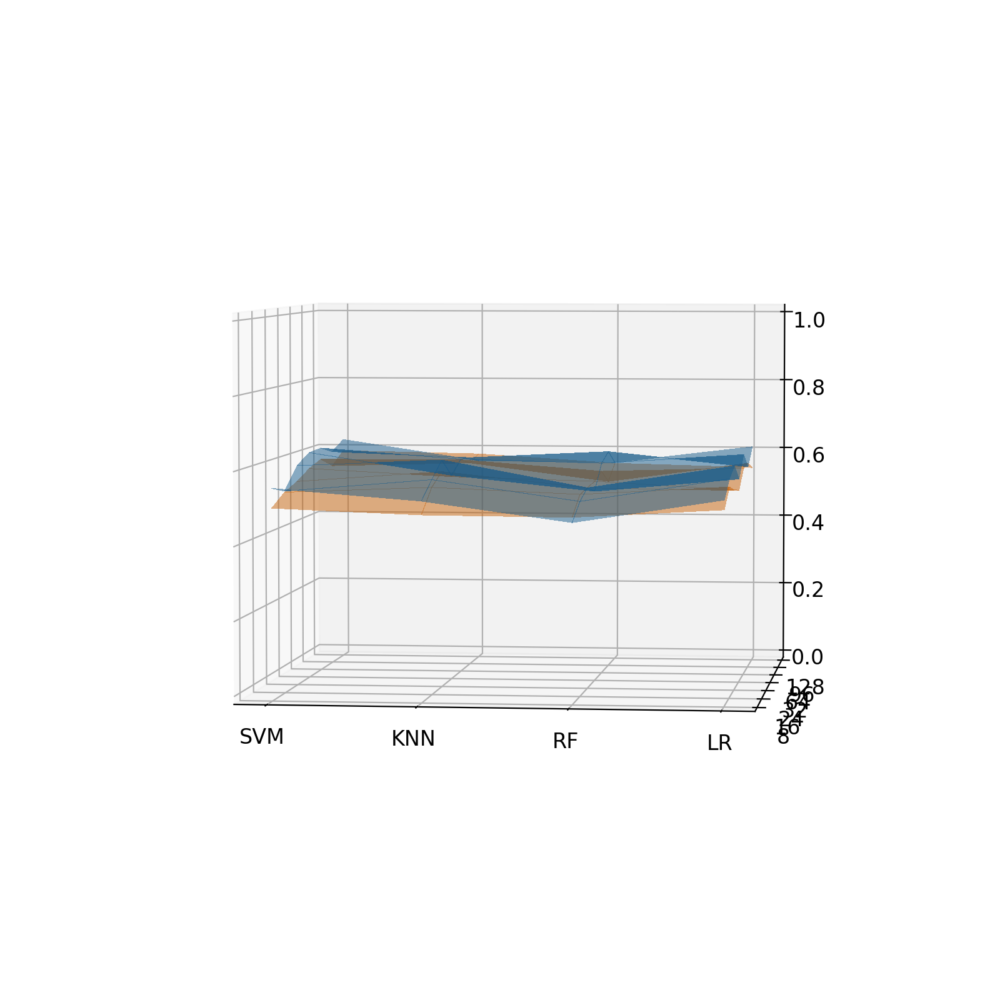

In [37]:
loss_df_1 = pd.read_csv('../results/1_1.csv', index_col=0)
test_loss_df_1 = loss_df_1.apply(lambda column: column.apply(lambda losses: float(losses.split("/")[1])))

loss_df_2 = pd.read_csv('../results/1_2.csv', index_col=0)
test_loss_df_2 = loss_df_2.apply(lambda column: column.apply(lambda losses: float(losses.split("/")[1])))

drawResults3d([test_loss_df_1.values, test_loss_df_2.values])

<IPython.core.display.Javascript object>


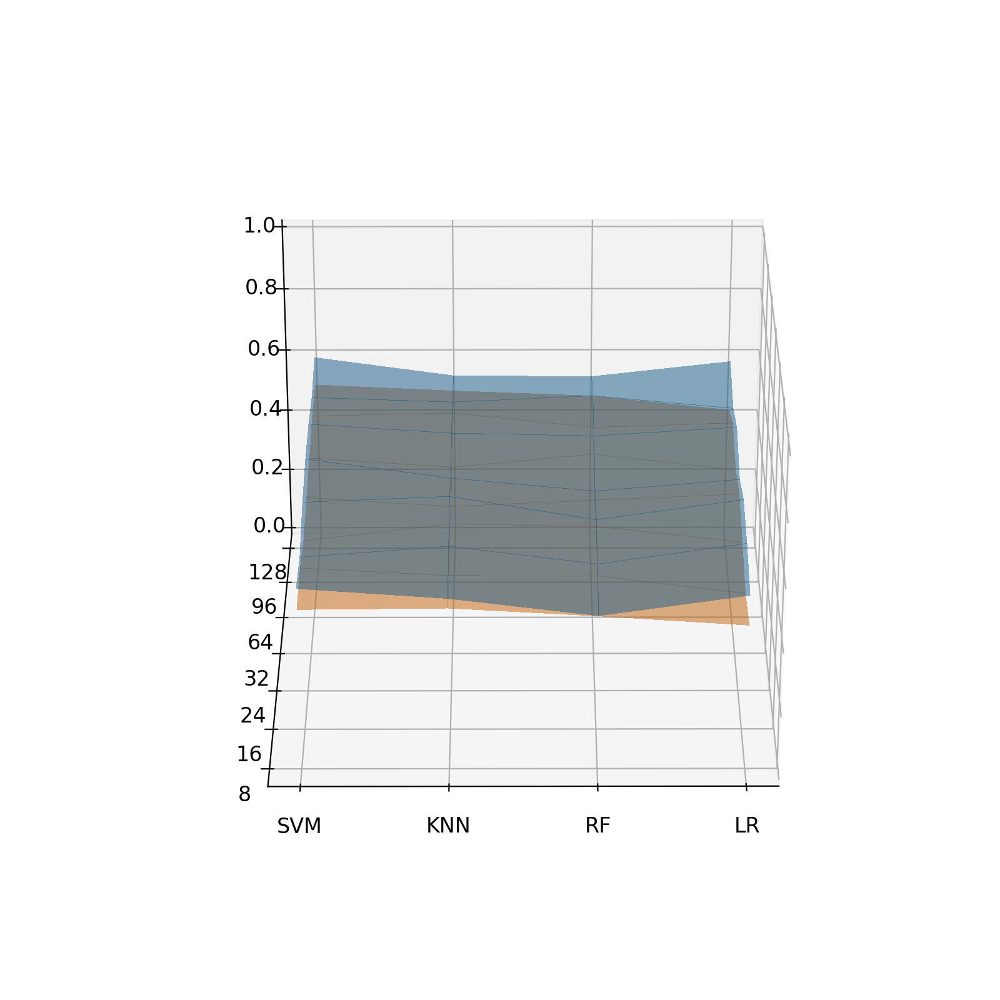

In [38]:
loss_df_1 = pd.read_csv('../results/1_1.csv', index_col=0)
test_loss_df_1 = loss_df_1.apply(lambda column: column.apply(lambda losses: float(losses.split("/")[1])))

loss_df_2 = pd.read_csv('../results/2_1.csv', index_col=0)
test_loss_df_2 = loss_df_2.apply(lambda column: column.apply(lambda losses: float(losses.split("/")[1])))

drawResults3d([test_loss_df_1.values, test_loss_df_2.values])

<IPython.core.display.Javascript object>


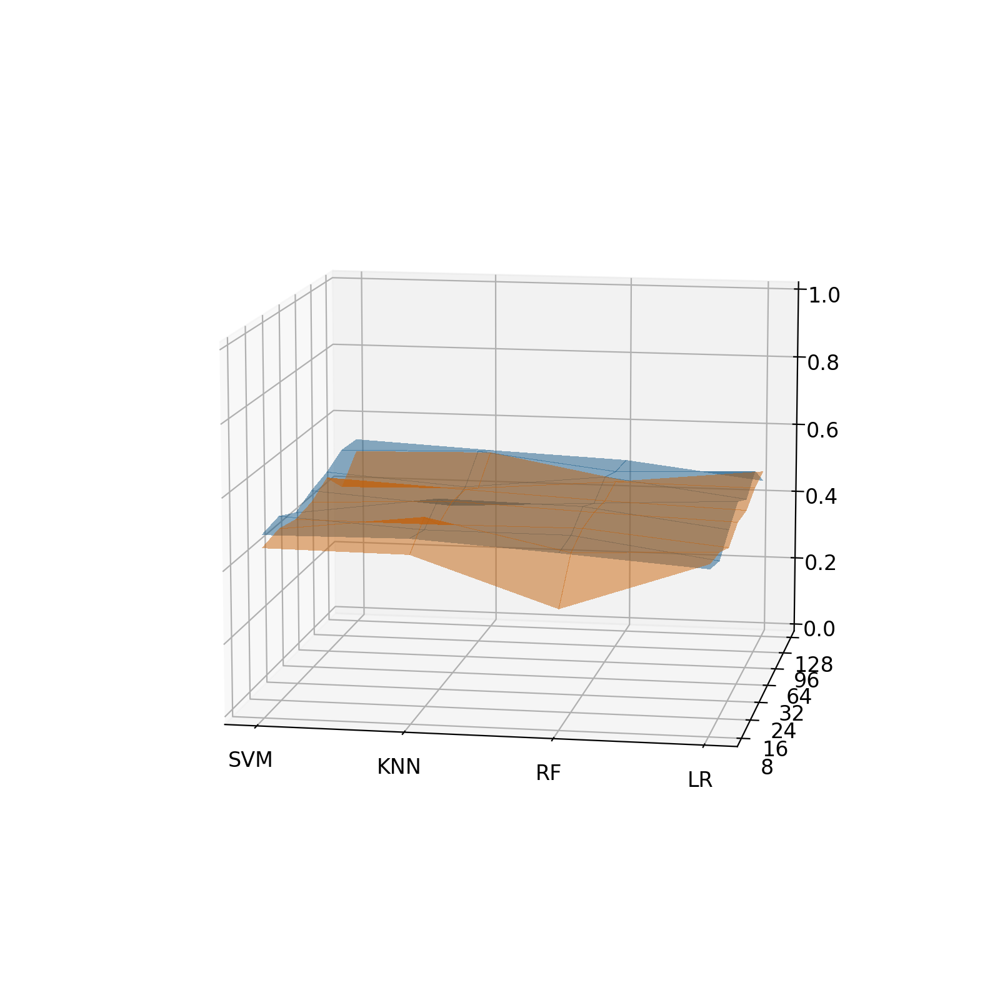

In [39]:
loss_df_1 = pd.read_csv('../results/2_1.csv', index_col=0)
test_loss_df_1 = loss_df_1.apply(lambda column: column.apply(lambda losses: float(losses.split("/")[1])))

loss_df_2 = pd.read_csv('../results/2_2.csv', index_col=0)
test_loss_df_2 = loss_df_2.apply(lambda column: column.apply(lambda losses: float(losses.split("/")[1])))

drawResults3d([test_loss_df_1.values, test_loss_df_2.values])

In [71]:
def drawResults2d(results_df, ax=None):
    index = results_df.index
    results_df = results_df.set_index(np.arange(0, len(index), 1))
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(5,5))
    results_df.plot(ax=ax)
    
    ax.set_xticks(results_df.index)
    ax.set_xticklabels(index)

    return ax

def drawTest(experiment_number, ax = None):
    loss_df = pd.read_csv('../results/{}.csv'.format(experiment_number), index_col=0)
    test_loss_df = loss_df.apply(lambda column: column.apply(lambda losses: float(losses.split("/")[1])))

    ax = drawResults2d(test_loss_df, ax)
    ax.set_title(experiment_number.replace("_", "."))

<IPython.core.display.Javascript object>


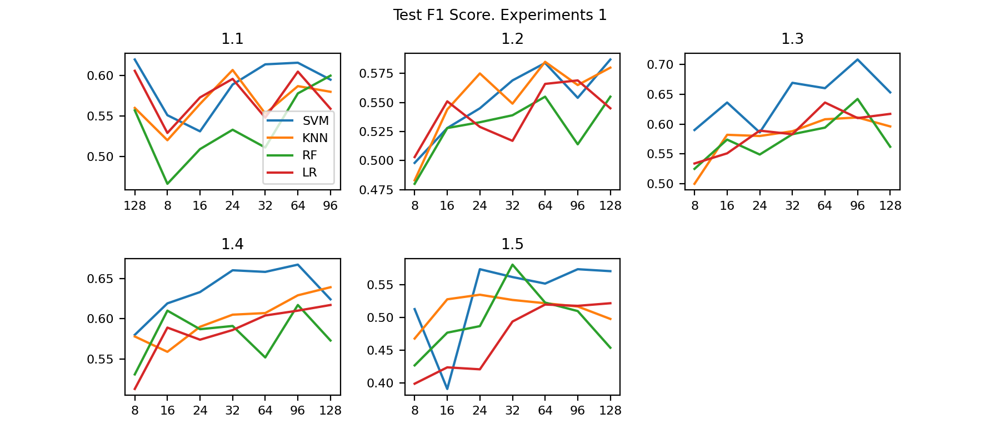

No handles with labels found to put in legend.


In [125]:
plt.rcParams['font.size'] = 8
fig = plt.figure(figsize=(9,4))
fig.suptitle("Test F1 Score. Experiments 1")
gs = gridspec.GridSpec(2, 3)
gs.update(wspace=0.3, hspace=0.5)
ax = []
for i in range(6):
    ax.append(plt.subplot(gs[i]))

drawTest('1_1', ax[0])
drawTest('1_2', ax[1])
drawTest('1_3', ax[2])
drawTest('1_4', ax[3])
drawTest('1_5', ax[4])

for x in ax[1:]:
    x.legend().remove()

ax[5].axis('off')
plt.show()






<IPython.core.display.Javascript object>


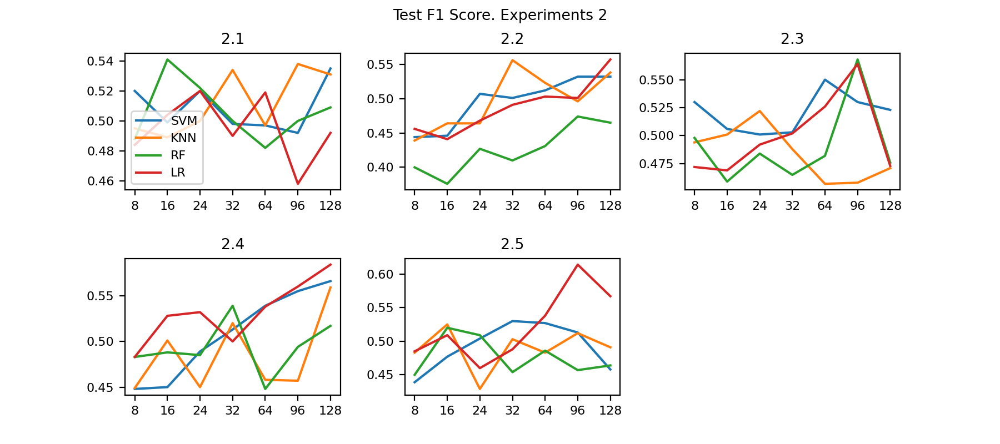

No handles with labels found to put in legend.


In [154]:
plt.rcParams['font.size'] = 8
fig = plt.figure(figsize=(9,4))
fig.suptitle("Test F1 Score. Experiments 2")
gs = gridspec.GridSpec(2, 3)
gs.update(wspace=0.3, hspace=0.5)
ax = []
for i in range(6):
    ax.append(plt.subplot(gs[i]))

drawTest('2_1', ax[0])
drawTest('2_2', ax[1])
drawTest('2_3', ax[2])
drawTest('2_4', ax[3])
drawTest('2_5', ax[4])

for x in ax[1:]:
    x.legend().remove()

ax[5].axis('off')
plt.show()

<IPython.core.display.Javascript object>


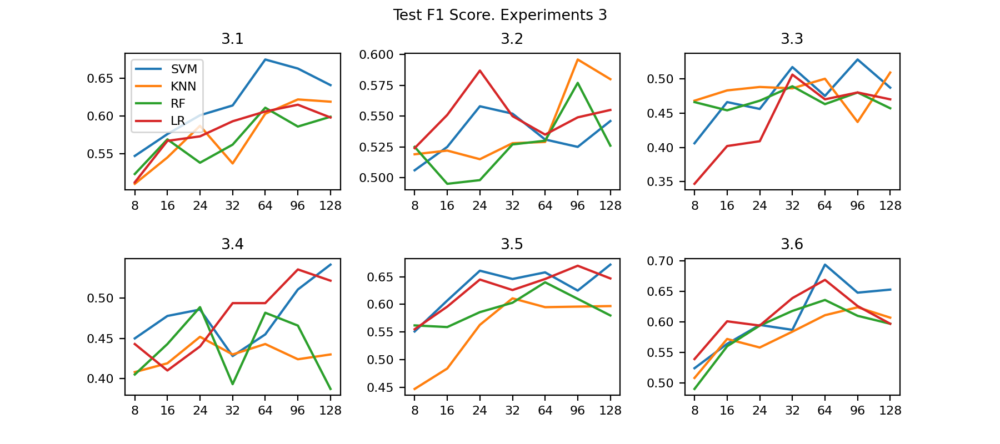

In [144]:
plt.rcParams['font.size'] = 8
fig = plt.figure(figsize=(9,4))
fig.suptitle("Test F1 Score. Experiments 3")
gs = gridspec.GridSpec(2, 3)
gs.update(wspace=0.3, hspace=0.5)
ax = []
for i in range(6):
    ax.append(plt.subplot(gs[i]))

drawTest('3_1', ax[0])
drawTest('3_2', ax[1])
drawTest('3_3', ax[2])
drawTest('3_4', ax[3])
drawTest('3_5', ax[4])
drawTest('3_6', ax[5])

for x in ax[1:]:
    x.legend().remove()

plt.show()

<IPython.core.display.Javascript object>


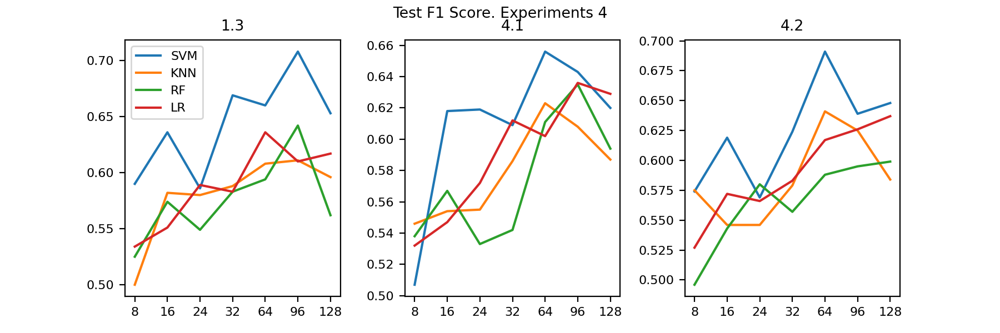

In [153]:
plt.rcParams['font.size'] = 8
fig = plt.figure(figsize=(9,3))
fig.suptitle("Test F1 Score. Experiments 4")
gs = gridspec.GridSpec(1, 3)
gs.update(wspace=0.3, hspace=1)
ax = []
for i in range(3):
    ax.append(plt.subplot(gs[i]))

drawTest('1_3', ax[0])
drawTest('4_1', ax[1])
drawTest('4_2', ax[2])

for x in ax[1:]:
    x.legend().remove()

plt.show()